# Gradients
- Extension on morphological gradients. 
- Gradient is a direcitional change in intensity or color of an image
- There are algorithms that can track the sort of direction
- Sobel feldman operators (or sobel)
- You can normalized y/x gradient from sobel feldman operator.
- And can do it in both that show both sides of story, the x and y gradients at the same time. 

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
def show_image(image, color=None):
    fig = plt.figure(figsize=(22, 20))
    ax = fig.add_subplot(111)
    ax.imshow(image, cmap='gray')
    plt.show()

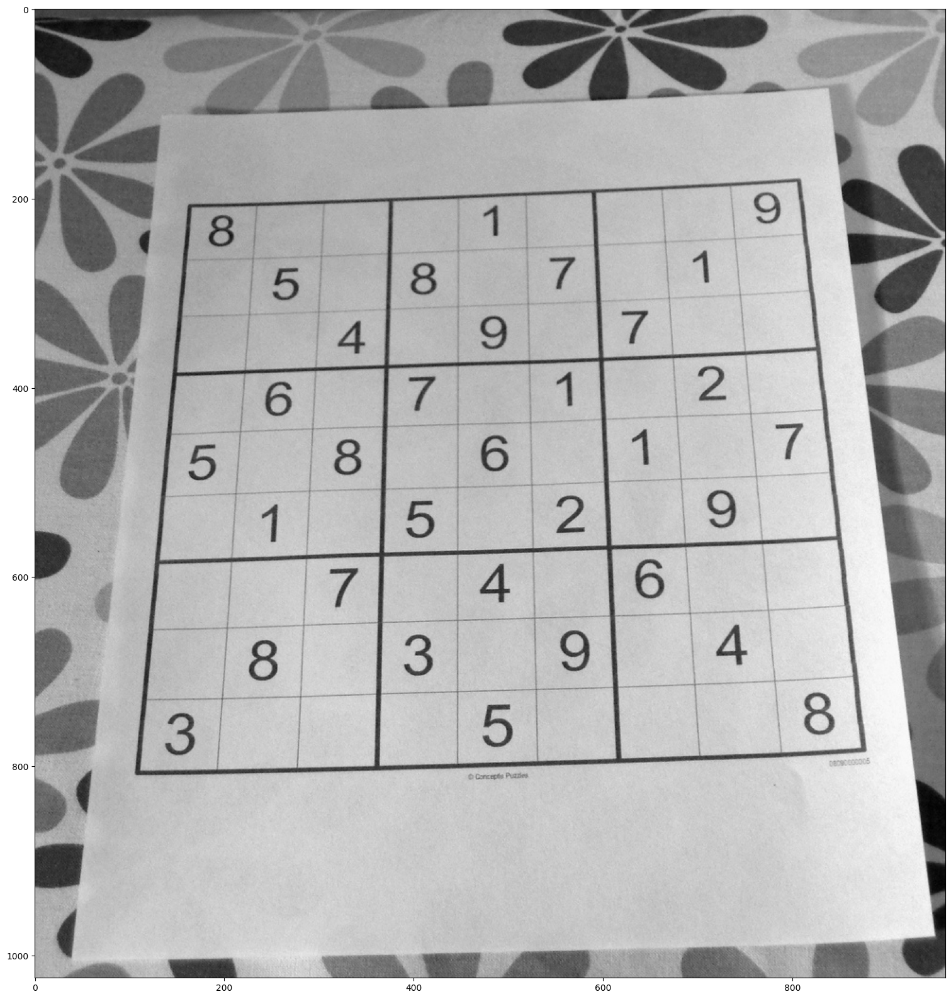

In [4]:
img = cv2.imread('../Computer-Vision-with-Python/Computer-Vision-with-Python/DATA/sudoku.jpg', 0) # read in gray scale
show_image(img)

Parameters
1. Pass src = img
2. desired depth (which is the depth of precision of each pixel, menaing that more bits, larger numbers, more colors and intensities can represent
3. x gradient
4. y gradient
5. kernel size

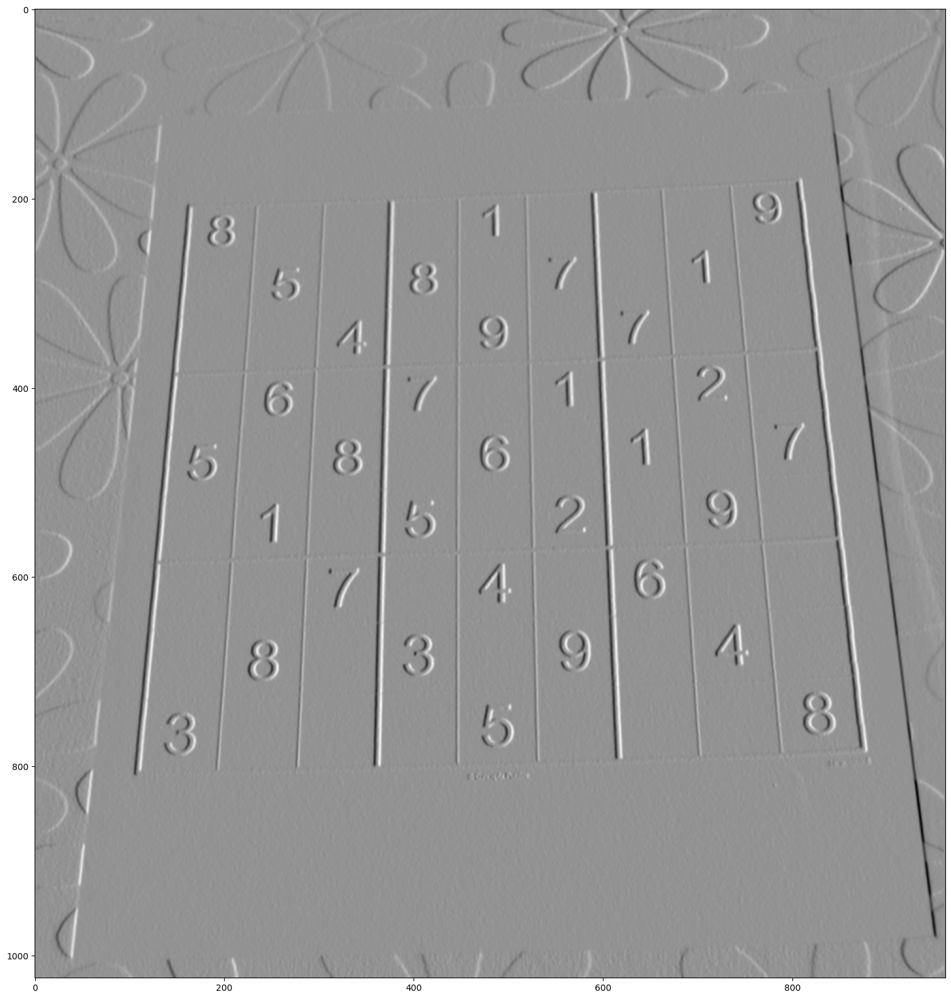

In [5]:
sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5) # 64 floating point precision. using 1 for dx to calculate the gradient
show_image(sobel_x) # here see vertical lines, but no horizontal lines

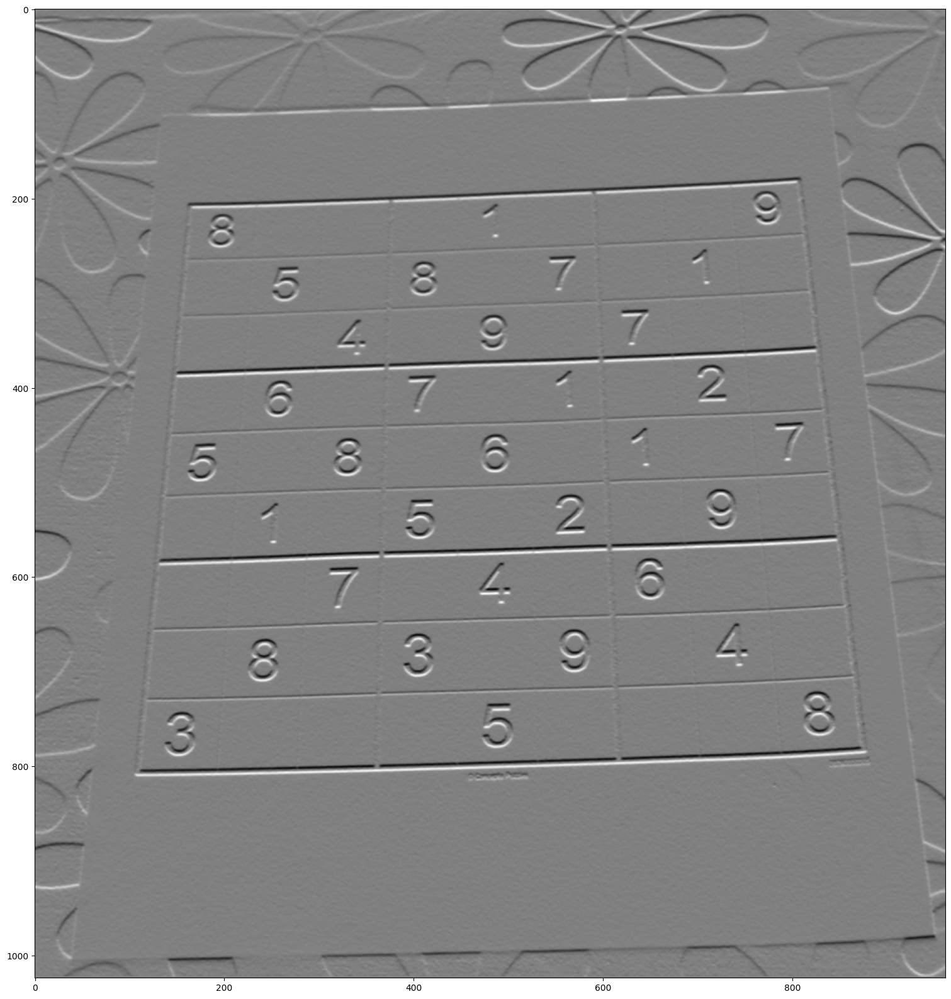

In [6]:
sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5) # 64 floating point precision. using 1 for dx to calculate the gradient
show_image(sobel_y) # here see horitzontal lines, but not that much the veritcal ones. but doesnt completely eliminate vertical lines because they were thick

# Laplace gradient
- One more graidnet type is using laplacian derivatives. This calcultes laplacian of the image, given by the relationship between the two derivates regarding to x and y
- Will make something similar to the previous methods but now it will apply it to both x and y

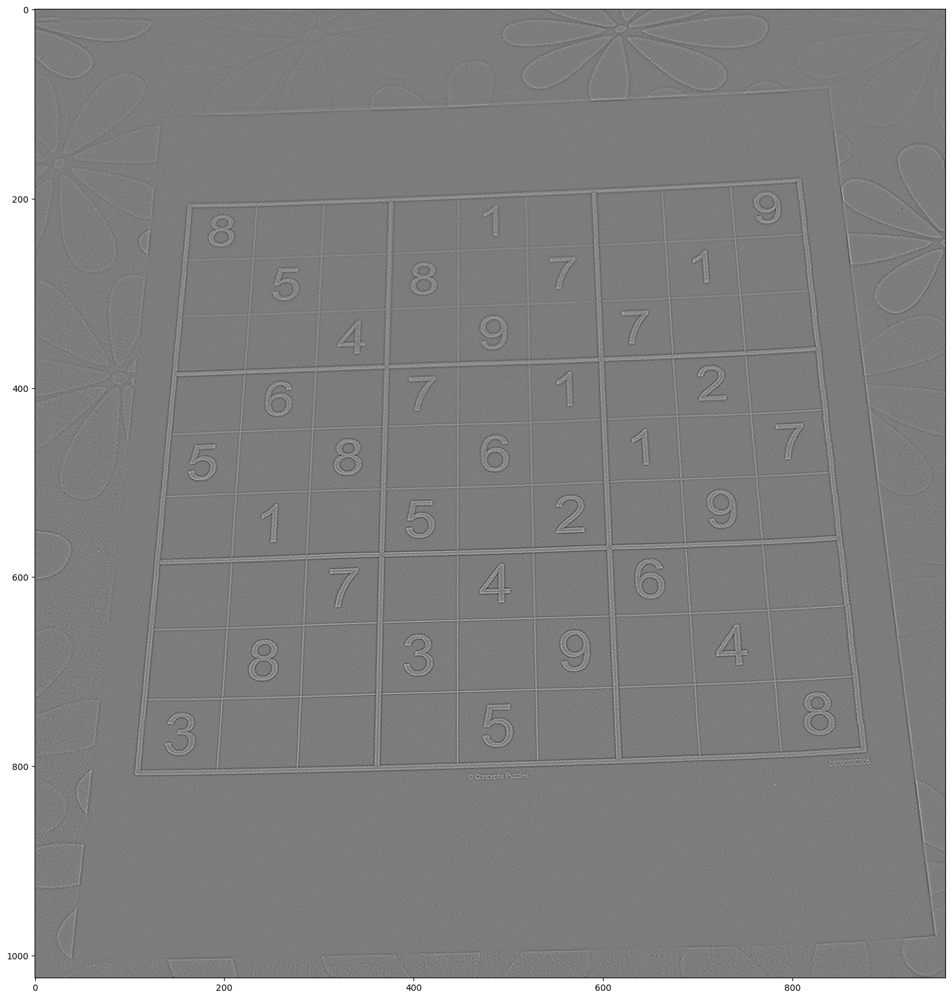

In [7]:
laplacian = cv2.Laplacian(img, cv2.CV_64F) # do somethign similar on gradient detection on xy
show_image(laplacian)

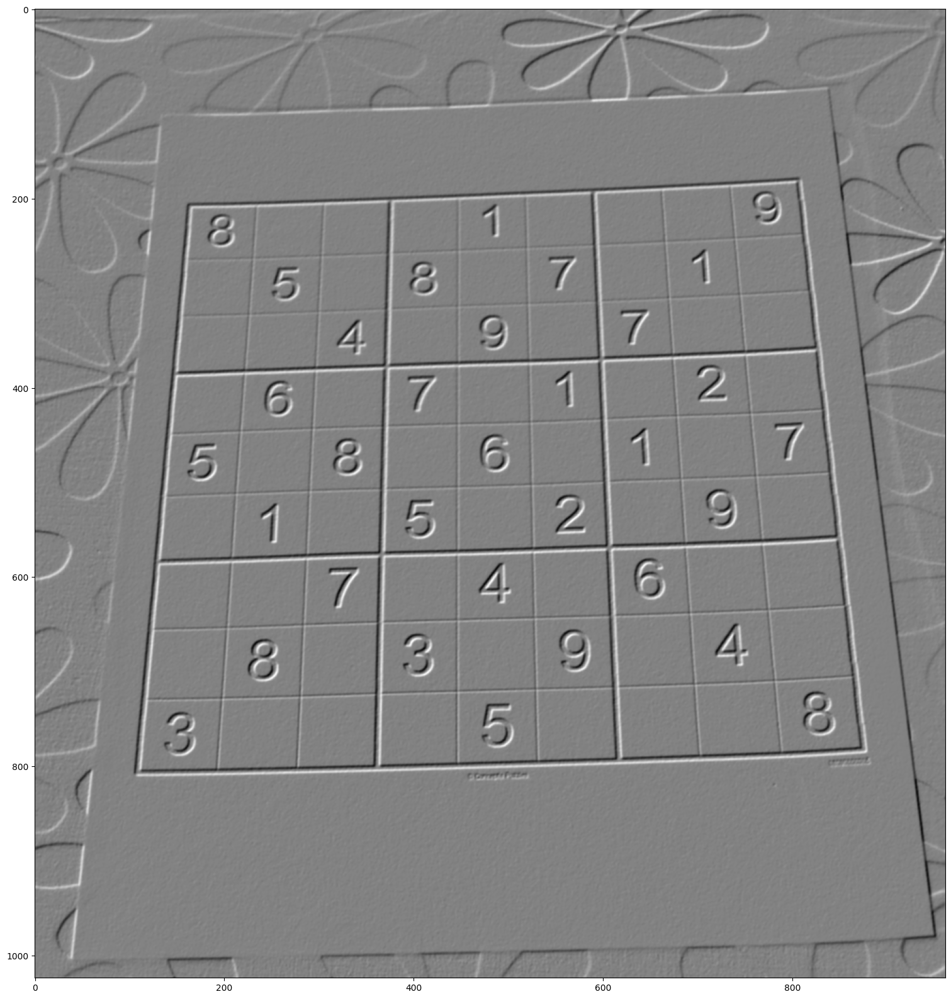

In [8]:
blended = cv2.addWeighted(src1=sobel_x, alpha=0.5, src2=sobel_y, beta=0.5, gamma=0) # can selectively choose which sobels to give more weight in the new...
                # blended image
show_image(blended)

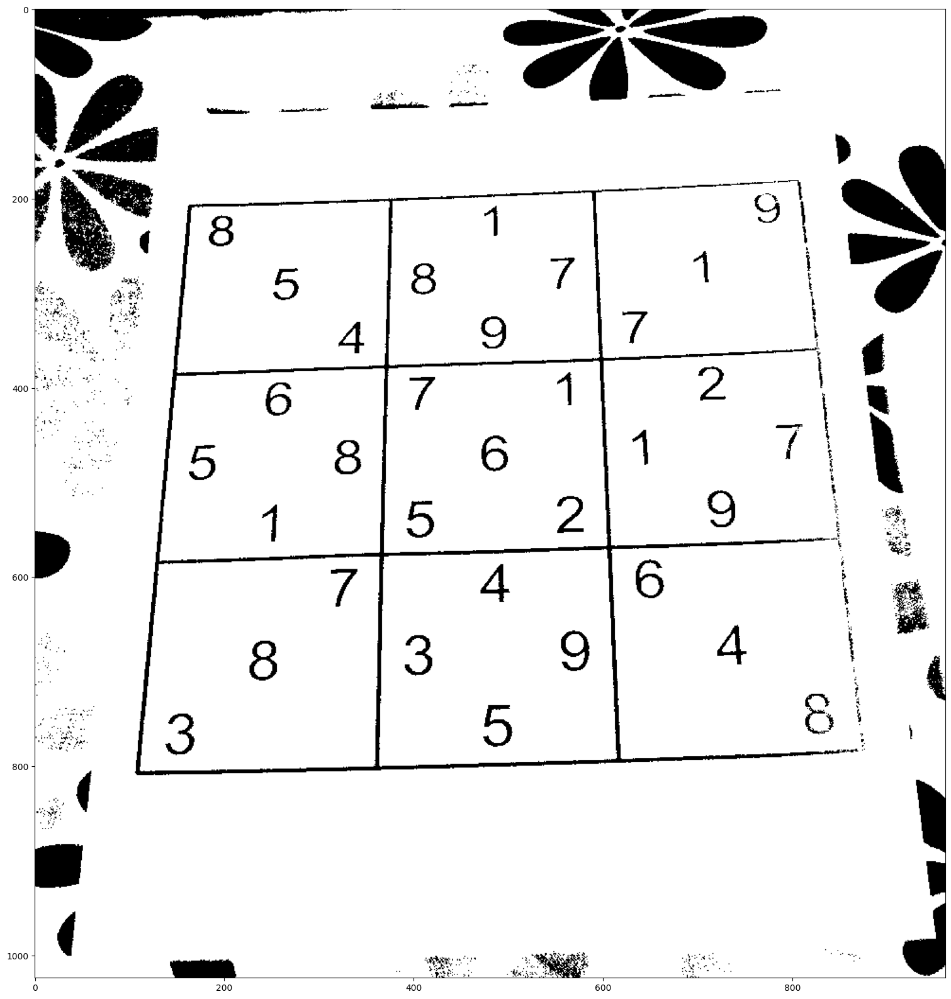

In [9]:
ret, th1 = cv2.threshold(img, 100, 255, cv2.THRESH_BINARY)
show_image(th1)

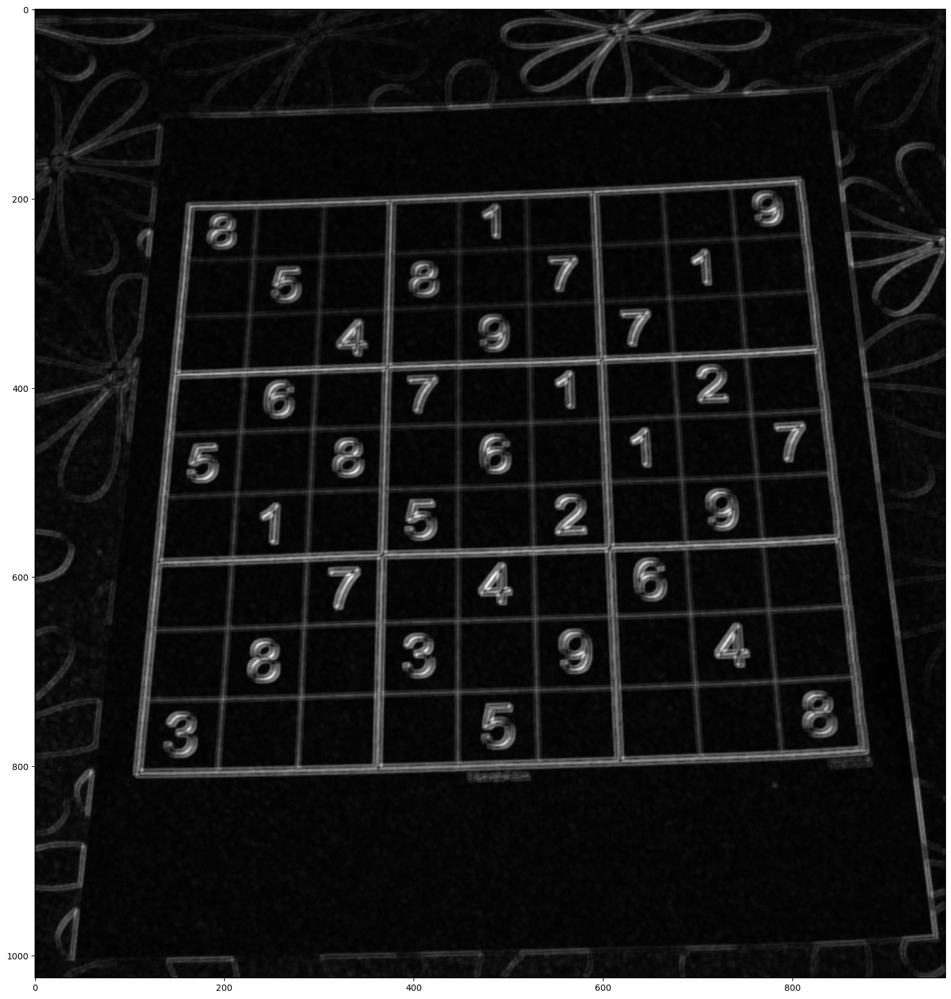

In [11]:
kernel = np.ones((4, 4), np.uint8)
gradient = cv2.morphologyEx(blended, cv2.MORPH_GRADIENT, kernel)
show_image(gradient)